In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import graphtools as gt
import phate
import magic
import scprep
#import cmocean
import sklearn
import scipy
import seaborn as sns
import meld
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.settings.verbosity = 3  

In [3]:
# set output directory
fig_dir = "/dfs3b/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/Nurr2c_vs_GFP/figures/"
data_dir = "/dfs3b/swaruplab/smorabit/collab/woodlab/cocaine_mouse_2021/Nurr2c_vs_GFP/data/"

sc.settings.figdir = fig_dir

In [4]:
# load processed data
adata = sc.read_h5ad('{}harmony_annotated.h5ad'.format(data_dir))

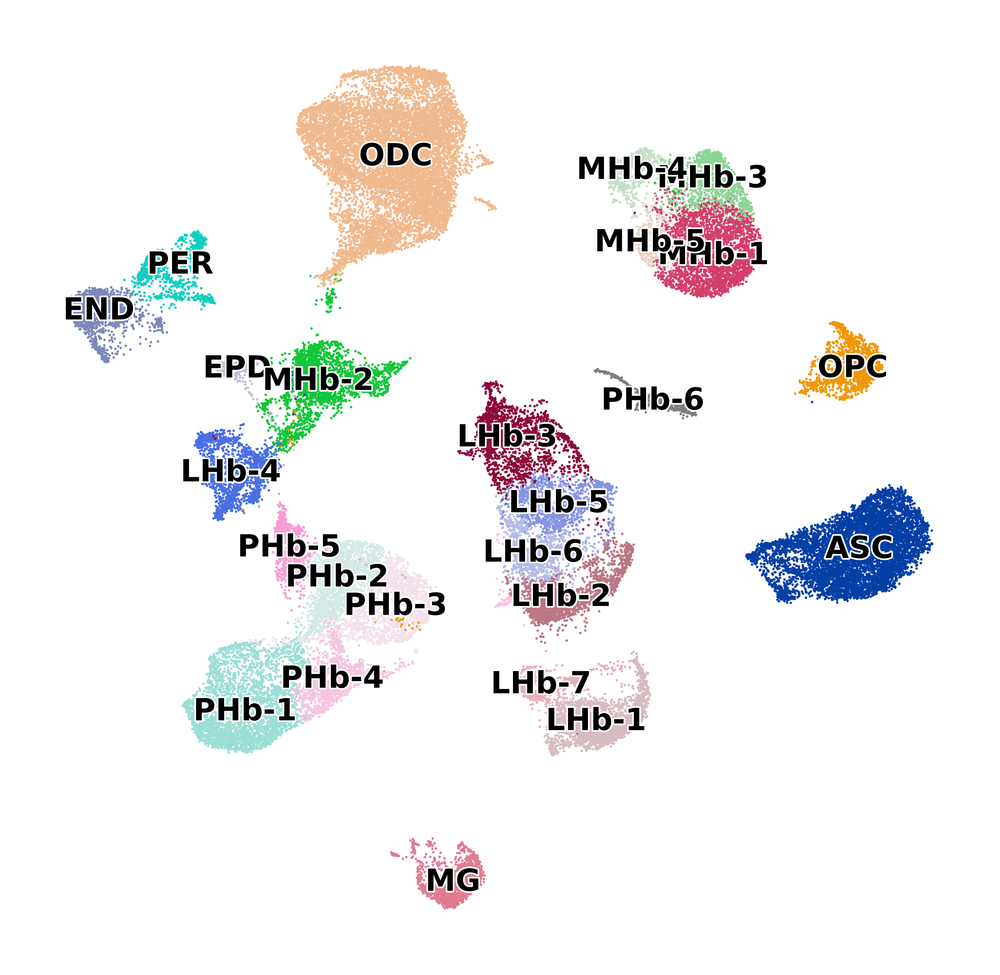

In [5]:
# plot UMAP to test that it loaded correctly:
sc.pl.umap(adata, color=['annotation'],frameon=False, legend_loc='on data', legend_fontoutline=1, legend_fontsize=9, add_outline=False, title='')


## Run MELD

In [6]:
adata.obs['Condition_Sample'] = adata.obs[['Group', 'Sample']].apply(lambda row: '_'.join(row.values.astype(str)), axis=1)


In [7]:
benchmarker = meld.Benchmarker()

from joblib import Parallel, delayed

def simulate_pdf_calculate_likelihood(benchmarker, seed, beta):
    benchmarker.set_seed(seed)
    benchmarker.generate_ground_truth_pdf()
    
    benchmarker.generate_sample_labels()
    benchmarker.calculate_MELD_likelihood(beta=beta)
    MELD_mse = benchmarker.calculate_mse(benchmarker.expt_likelihood)
    return MELD_mse, seed, beta, benchmarker.graph.knn


In [10]:
benchmarker.fit_phate(adata.obsm['X_pca_harmony']);

Calculating PHATE...
  Running PHATE on 56505 observations and 50 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 183.96 seconds.
    Calculating affinities...
    Calculated affinities in 1.94 seconds.
  Calculated graph and diffusion operator in 185.96 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 5.89 seconds.
    Calculating KMeans...
    Calculated KMeans in 12.10 seconds.
  Calculated landmark operator in 19.82 seconds.
  Calculating optimal t...
    Automatically selected t = 29
  Calculated optimal t in 0.95 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.33 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 52.45 seconds.
Calculated PHATE in 259.52 seconds.


In [11]:
knn_range = np.arange(1,25)
beta_range = np.arange(1,200)

In [ ]:
results = []

with Parallel(n_jobs=36) as p:
    for knn in knn_range:
        # doing this outside the parallel loop because building the graph takes the longest
        benchmarker.fit_graph(adata.X, knn=knn)
        print(knn)
        curr_results = p(delayed(simulate_pdf_calculate_likelihood)(benchmarker, seed, beta) \
                                       for seed in range(25) for beta in beta_range)
        curr_results = pd.DataFrame(curr_results, columns = ['MSE', 'seed', 'beta', 'knn'])
        results.append(curr_results)

results = pd.concat(results, axis=0)

1
2
3
4


In [ ]:
results.to_csv('{}meld_benchmarking.csv'.format(data_dir))

In [ ]:
# We want to take the average of each set of random seeds for each combination of beta and knn values
results_wide = results.groupby(['beta', 'knn']).mean().sort_values(by='MSE').reset_index()

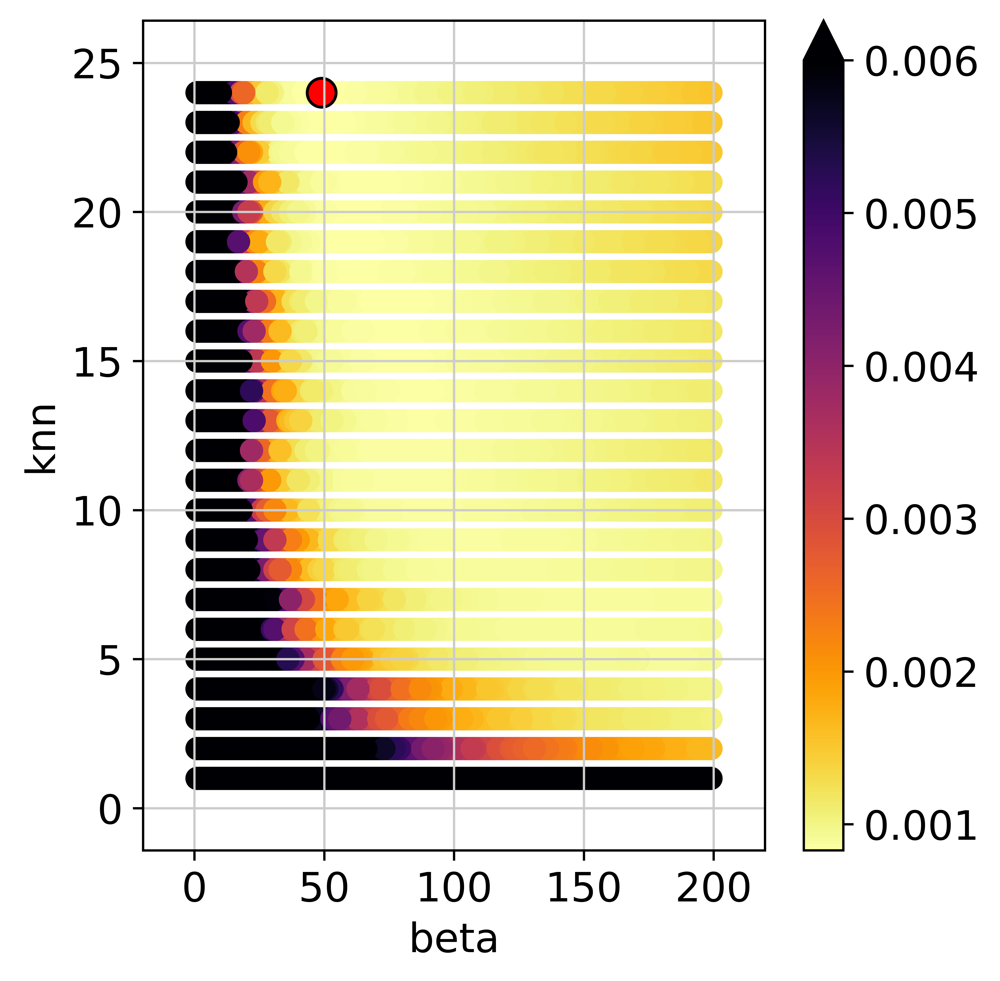

In [19]:
ax = scprep.plot.scatter(results_wide['beta'], results_wide['knn'], 
                         s=50, c=results_wide['MSE'], vmax=0.006, cmap='inferno_r')

# Highlight the top performing combination with a large red dot
top_result = results_wide.sort_values('MSE').iloc[0]
ax.scatter(top_result['beta'], top_result['knn'], c='r', s=100, linewidth=1, edgecolor='k')

## Run MELD with best parameters

In [21]:
G = gt.Graph(adata.obsm['X_pca_harmony'], knn=int(top_result['knn']), use_pygsp=True)


In [48]:
meld_op = meld.MELD(beta=top_result['beta'])
sample_densities = meld_op.fit_transform(G, sample_labels=adata.obs.Condition_Sample)

Building graph on 56505 samples and 50 features.


In [49]:
sample_densities.head()

,GFP_Sample-13,GFP_Sample-4,GFP_Sample-5,GFP_Sample-8,GFP_Sample-9,Nurr2c_Sample-1,Nurr2c_Sample-11,Nurr2c_Sample-14,Nurr2c_Sample-16,Nurr2c_Sample-2,Nurr2c_Sample-3
0,0.000094,0.000012,0.000048,0.000022,6.164774e-07,0.000013,0.000002,0.000017,0.000014,0.000006,0.000005
1,0.000028,0.000010,0.000016,0.000021,1.194366e-05,0.000014,0.000014,0.000029,0.000030,0.000013,0.000017
2,0.000099,0.000012,0.000045,0.000019,3.217756e-07,0.000016,0.000003,0.000016,0.000015,0.000006,0.000005
3,0.000025,0.000017,0.000016,0.000027,5.807966e-06,0.000011,0.000009,0.000037,0.000030,0.000010,0.000020
4,0.000044,0.000018,0.000026,0.000021,3.450986e-07,0.000017,0.000002,0.000078,0.000007,0.000008,0.000009


In [50]:
replicates = np.unique(adata.obs['Condition_Sample'])
sample_likelihoods = sample_densities.copy()
for rep in replicates:
    curr_cols = sample_densities.columns[[col.startswith(rep) for col in sample_densities.columns]]
    scaler = sklearn.preprocessing.MinMaxScaler()
    sample_likelihoods[curr_cols] = scaler.fit_transform(sample_densities[curr_cols])



sample_likelihoods

,GFP_Sample-13,GFP_Sample-4,GFP_Sample-5,GFP_Sample-8,GFP_Sample-9,Nurr2c_Sample-1,Nurr2c_Sample-11,Nurr2c_Sample-14,Nurr2c_Sample-16,Nurr2c_Sample-2,Nurr2c_Sample-3
0,0.344401,0.112476,0.696934,0.293452,0.003461,0.108365,0.022769,0.099287,0.150615,0.094963,0.050347
1,0.101039,0.089016,0.239182,0.286344,0.069141,0.119577,0.161985,0.166621,0.310807,0.217806,0.182820
2,0.365102,0.112721,0.652497,0.249572,0.001752,0.131389,0.027565,0.092170,0.159694,0.092292,0.052127
3,0.091545,0.158810,0.234089,0.364512,0.033563,0.087985,0.103144,0.215122,0.313180,0.176372,0.221714
4,0.161146,0.169740,0.385426,0.275703,0.001888,0.142839,0.023933,0.449692,0.075441,0.134263,0.101537
...,...,...,...,...,...,...,...,...,...,...,...
56500,0.025363,0.143190,0.155327,0.306320,0.192712,0.143505,0.209419,0.038989,0.150647,0.431711,0.163969
56501,0.082516,0.328048,0.147673,0.189555,0.103598,0.106522,0.113748,0.163659,0.271223,0.331151,0.137876
56502,0.072793,0.686393,0.023403,0.108507,0.064777,0.071107,0.031047,0.238049,0.360691,0.197824,0.125716
56503,0.061885,0.166708,0.278055,0.205109,0.065399,0.152012,0.146030,0.119412,0.276763,0.268617,0.249561


In [51]:
condition_cols = sample_likelihoods.columns[[col.startswith("Nurr2c") for col in sample_likelihoods.columns]]
mean_likelihoods = sample_likelihoods[condition_cols].mean(axis=1).values
adata.obs['Nurr2c_likelihood'] = scaler.fit_transform(mean_likelihoods.reshape(-1,1))


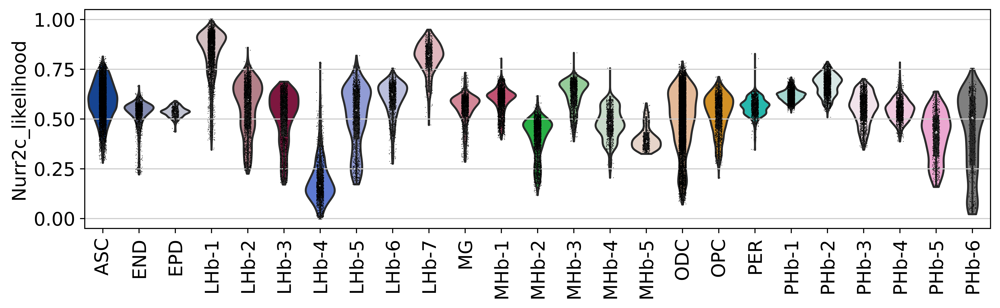

In [52]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,3), facecolor='white')
sc.pl.violin(adata,['Nurr2c_likelihood'], inner='box', size=0.5,  groupby='annotation', multi_panel=False, rotation=90)


In [53]:
adata.obs[['barcode', 'Nurr2c_likelihood']].to_csv('{}MELD_Nurr2c_likelihood.csv'.format(data_dir))

## Using Condition instead of Condition_Sample

In [54]:
meld_op = meld.MELD(beta=top_result['beta'])
sample_densities = meld_op.fit_transform(G, sample_labels=adata.obs.Group)

Building graph on 56505 samples and 50 features.


In [55]:
replicates = np.unique(adata.obs['Group'])
sample_likelihoods = sample_densities.copy()
for rep in replicates:
    curr_cols = sample_densities.columns[[col.startswith(rep) for col in sample_densities.columns]]
    scaler = sklearn.preprocessing.MinMaxScaler()
    sample_likelihoods[curr_cols] = scaler.fit_transform(sample_densities[curr_cols])



sample_likelihoods

,GFP,Nurr2c
0,0.745942,0.254058
1,0.375054,0.624946
2,0.724212,0.275788
3,0.399450,0.600550
4,0.461664,0.538336
...,...,...
56500,0.431887,0.568113
56501,0.431897,0.568103
56502,0.476463,0.523537
56503,0.354343,0.645657


In [56]:
adata.obs['Nurr2c_likelihood'] = sample_likelihoods['Nurr2c'].tolist()


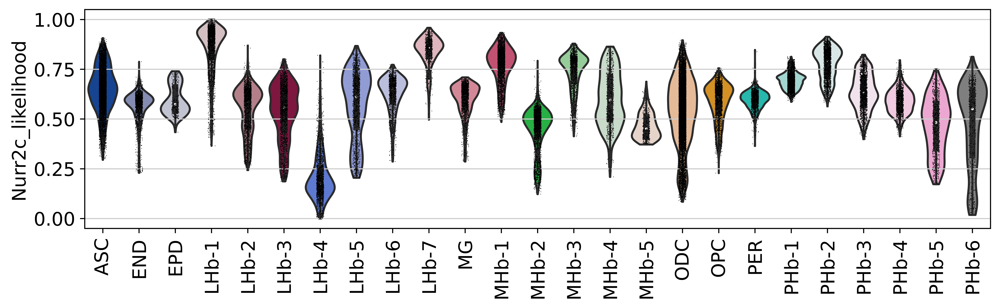

In [57]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,3), facecolor='white')
sc.pl.violin(adata,['Nurr2c_likelihood'], inner='box', size=0.5,  groupby='annotation', multi_panel=False, rotation=90)


## Save the results

In [58]:
adata.obs[['barcode', 'Nurr2c_likelihood']].to_csv('{}MELD_Nurr2c_likelihood.csv'.format(data_dir))